In [19]:
try:
    # Comment out if not using colab
    from google.colab import drive
    drive.mount('/content/drive')

    # Specific for luca's computer
    %cd "/content/drive/Othercomputers/Min MacBook Pro/INFO381-GitHub"
    using_colab = True
except:
    print("Not using Google Colab")
    using_colab = False

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/Othercomputers/Min MacBook Pro/INFO381-GitHub'
/content/drive/Othercomputers/Min MacBook Air/INFO381-GitHub


In [20]:
!pip install torch

In [21]:
!pip install torch torchvision torchcam

In [1]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.models as models
import torch.nn as nn

import torch.nn.functional as F

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchcam.methods import GradCAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image

# Local imports
import sys
import os

sys.path.append(os.path.abspath("../helper_functions"))
from utils import get_dataloaders, cherry_pick_img_real, cherry_pick_img_ai_generated

In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [24]:
train_loader, test_loader = get_dataloaders(batch_size=32, split = 'both')
print(test_loader)

Running in Google Colab


**Loading CNN**

In [26]:
cnn_model = models.resnet18(pretrained=False)
cnn_model.fc = nn.Linear(cnn_model.fc.in_features, 2)
cnn_model.load_state_dict(torch.load("models/resnet18_cnn.pth", map_location=device))
cnn_model.eval().to(device)
cnn_model.input_size = (512, 512)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [25]:
cnn_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

**Generating Grad-CAM**

In [27]:
class_names = ['AI GENERATED', 'REAL']

In [30]:
def generate_gradcam(image_path, model, transform, class_names):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)
    input_tensor = input_tensor.to(device)

    cam_extractor = GradCAM(model, target_layer="layer4")

    output = model(input_tensor)
    probs = F.softmax(output, dim=1)
    predicted_class = torch.argmax(probs, dim=1).item()

    print(f"📊 Prediction: {class_names[predicted_class]} (class {predicted_class})")

    activation_map = cam_extractor(predicted_class, output)

    img_resized = img.resize((512, 512))
    heatmap = to_pil_image(activation_map[0], mode='F')
    result = overlay_mask(img_resized, heatmap, alpha=0.5)

    return img_resized, result, class_names[predicted_class]



In [31]:
def show_side_by_side_from_paths(original_path, gradcam_image, title="CNN + Grad-CAM", filename="xai_output.png"):
    original_img = Image.open(original_path).convert("RGB").resize((512, 512))

    gradcam_image = gradcam_image.resize((512, 512))

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(original_img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(gradcam_image)
    axes[1].set_title(title)
    axes[1].axis("off")

    save_path = os.path.join("gui_images/GRADCAM/", filename)
    plt.savefig(save_path, bbox_inches="tight")

    plt.tight_layout()

    plt.show()

**Fetching images**

In [32]:
import os
os.makedirs("gui_images/GRADCAM/real/", exist_ok=True)
os.makedirs("gui_images/GRADCAM/ai_generated/", exist_ok=True)

In [34]:
# Real images
img_path_real_one = cherry_pick_img_real[1]
img_path_real_two = cherry_pick_img_real[2]
img_path_real_three = cherry_pick_img_real[3]
img_path_real_four = cherry_pick_img_real[4]
img_path_real_five = cherry_pick_img_real[5]
img_path_real_six = cherry_pick_img_real[6]
img_path_real_seven = cherry_pick_img_real[7]
img_path_real_eight = cherry_pick_img_real[8]
img_path_real_nine = cherry_pick_img_real[9]
img_path_real_ten = cherry_pick_img_real[10]

# AI-generated images
img_path_ai_one = cherry_pick_img_ai_generated[1]
img_path_ai_two = cherry_pick_img_ai_generated[2]
img_path_ai_three = cherry_pick_img_ai_generated[3]
img_path_ai_four = cherry_pick_img_ai_generated[4]
img_path_ai_five = cherry_pick_img_ai_generated[5]
img_path_ai_six = cherry_pick_img_ai_generated[6]
img_path_ai_seven = cherry_pick_img_ai_generated[7]
img_path_ai_eight = cherry_pick_img_ai_generated[8]
img_path_ai_nine = cherry_pick_img_ai_generated[9]
img_path_ai_ten = cherry_pick_img_ai_generated[10]

## Visualize real images

📊 Prediction: AI GENERATED (class 0)


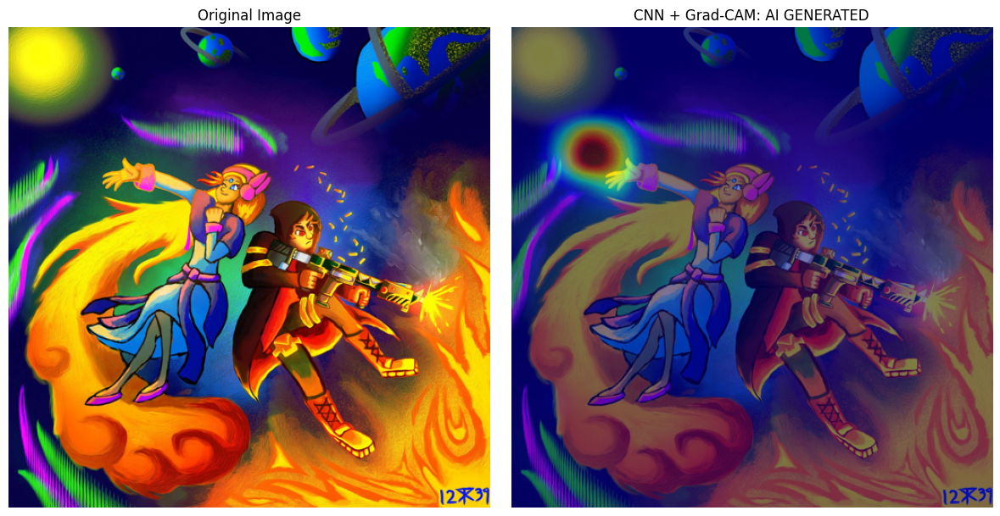

In [35]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_one,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_one,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img1.png"

)

📊 Prediction: REAL (class 1)


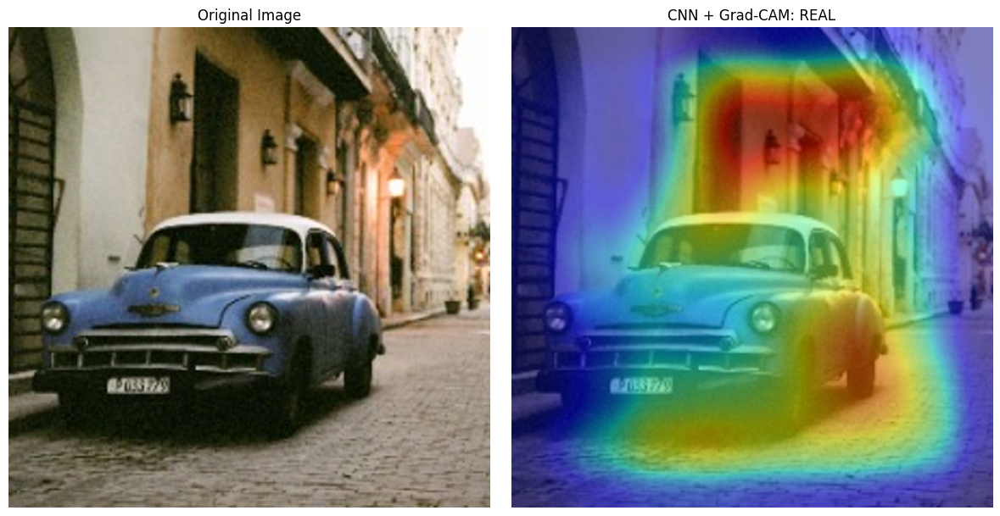

In [36]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_two,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_two,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img2.png"

)

📊 Prediction: REAL (class 1)


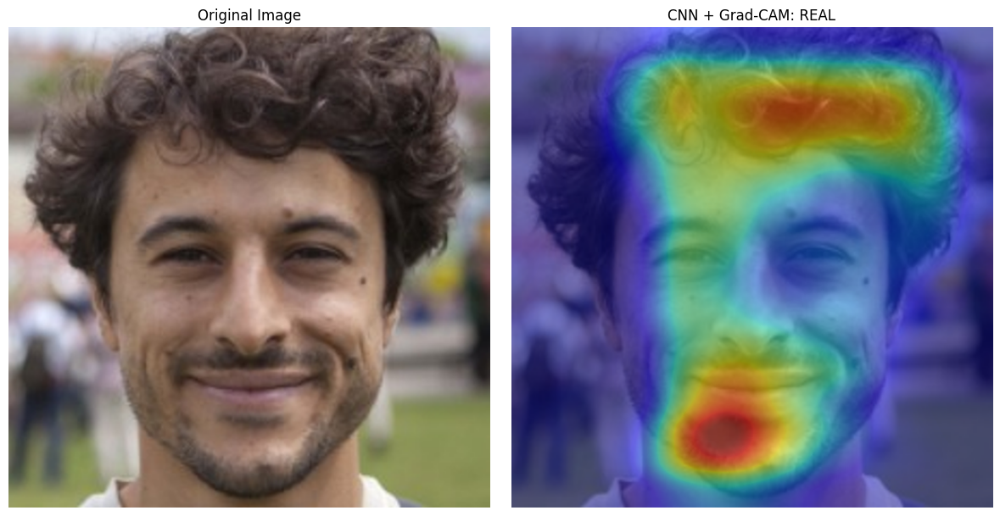

In [37]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_three,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_three,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img3.png"

)

📊 Prediction: REAL (class 1)


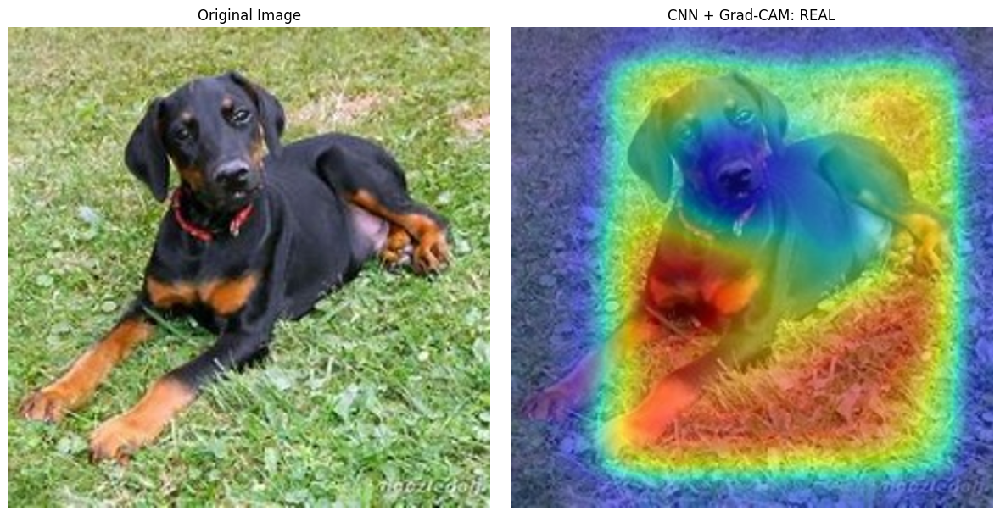

In [38]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_four,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_four,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img4.png"

)

📊 Prediction: REAL (class 1)


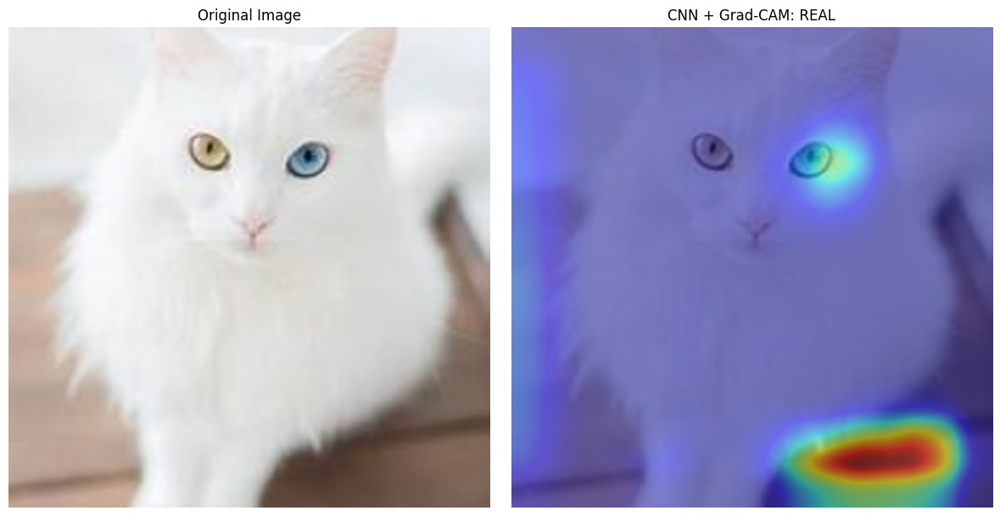

In [39]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_five,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_five,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img5.png"

)

📊 Prediction: REAL (class 1)


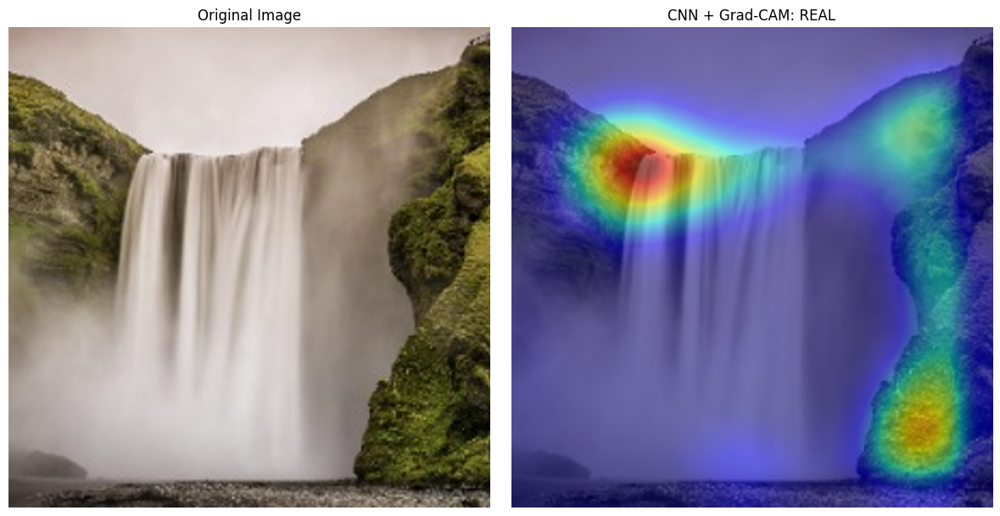

In [40]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_six,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_six,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img6.png"

)

📊 Prediction: REAL (class 1)


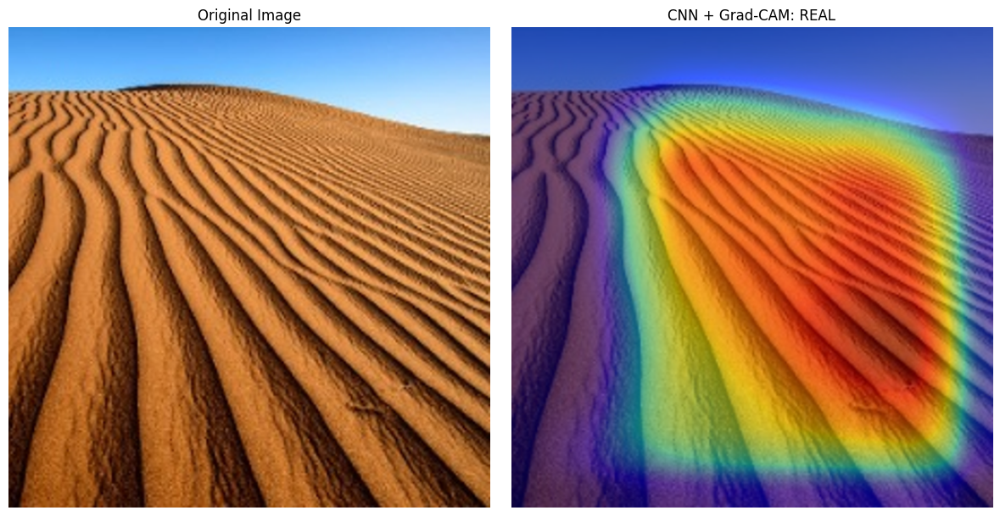

In [41]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_seven,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_seven,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img7.png"

)

📊 Prediction: REAL (class 1)


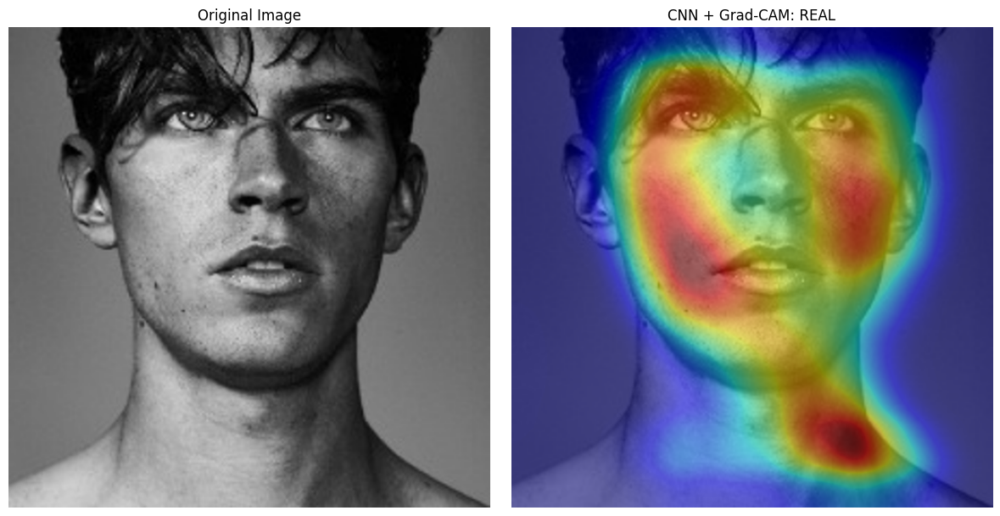

In [42]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_eight,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_eight,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img8.png"
)

📊 Prediction: REAL (class 1)


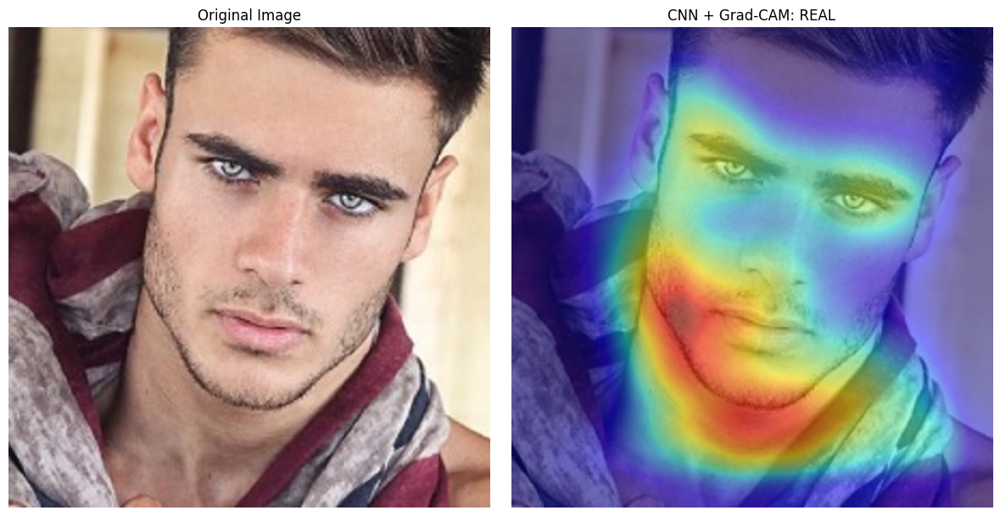

In [43]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_nine,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_nine,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img9.png"
)

📊 Prediction: AI GENERATED (class 0)


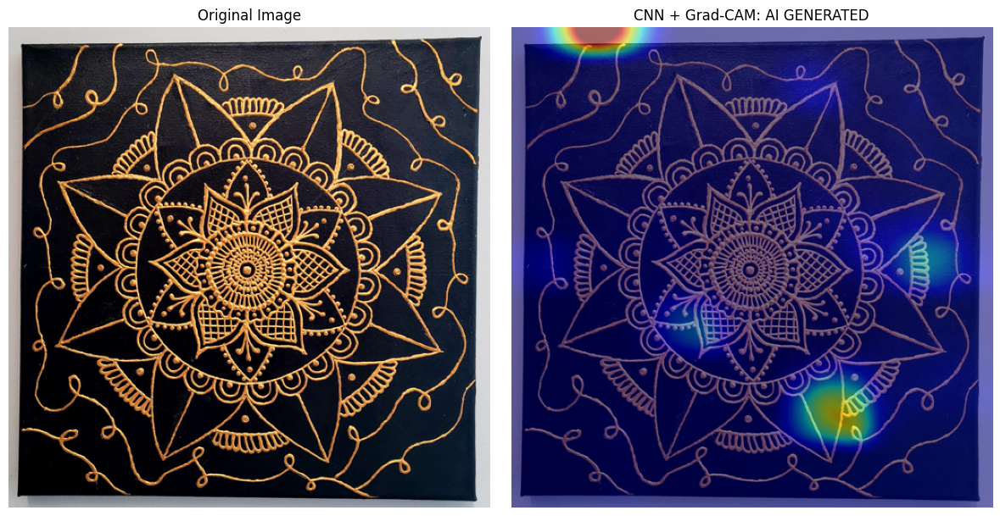

In [44]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_real_ten,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_real_ten,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"real/img10.png"
)

## Visualize ai-generated pictures

📊 Prediction: AI GENERATED (class 0)


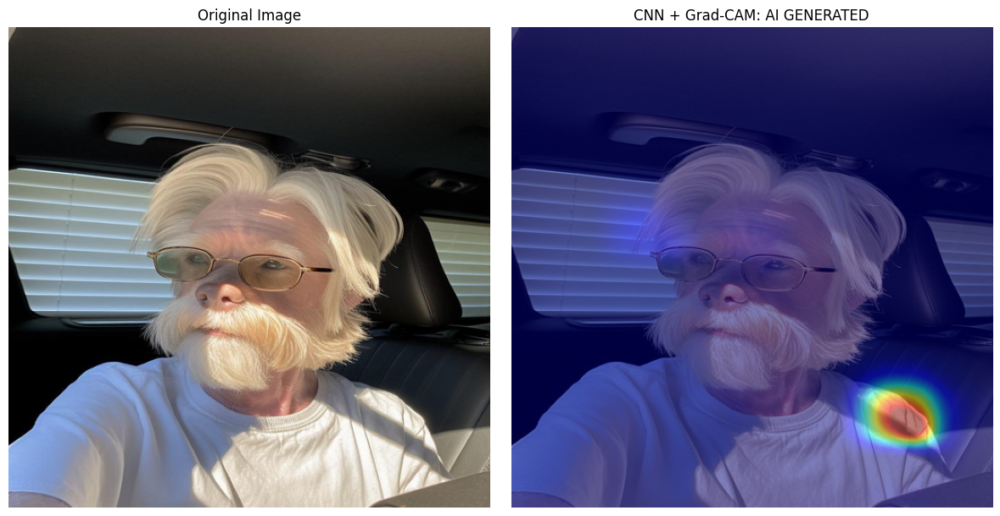

In [45]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_one,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_one,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img1.png"
)

📊 Prediction: REAL (class 1)


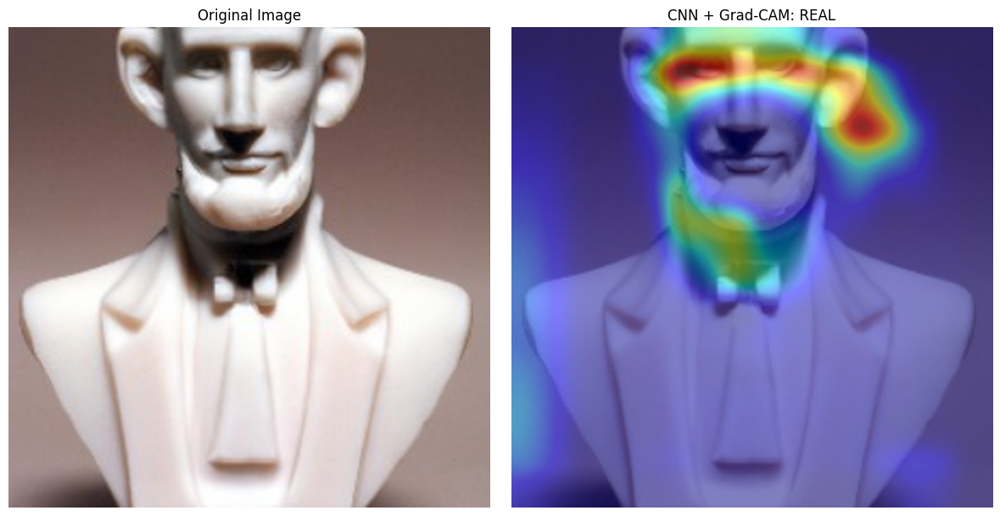

In [46]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_two,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_two,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img2.png"
)

📊 Prediction: AI GENERATED (class 0)


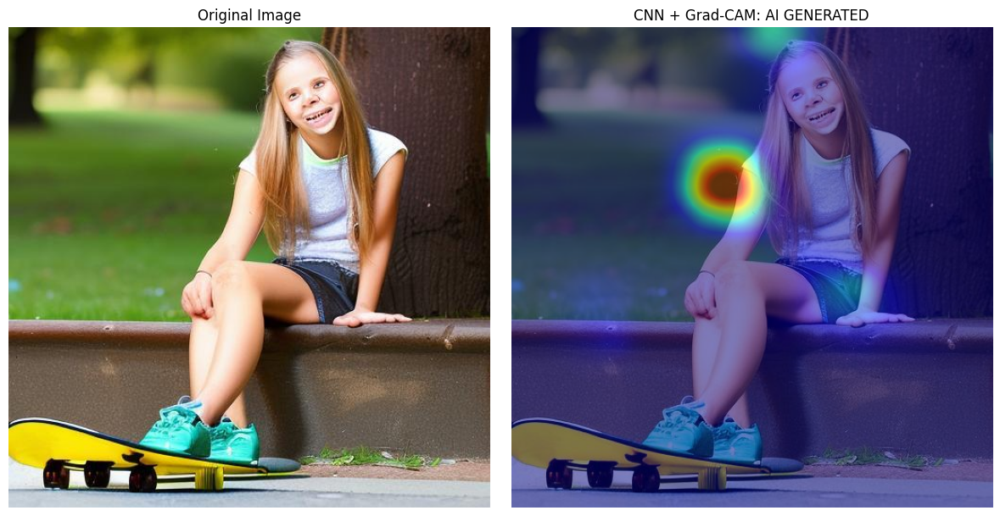

In [47]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_three,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_three,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img3.png"
)

📊 Prediction: AI GENERATED (class 0)


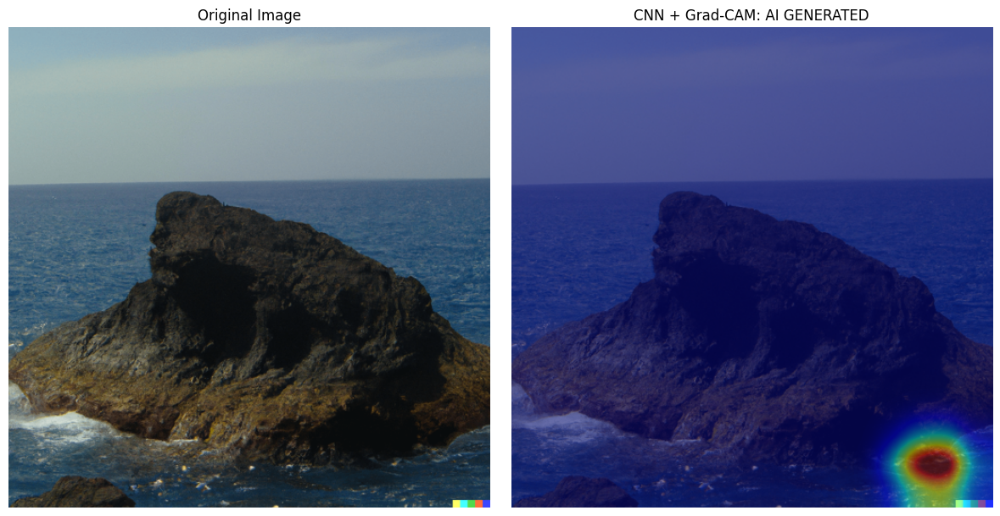

In [48]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_four,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_four,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img4.png"
)

📊 Prediction: AI GENERATED (class 0)


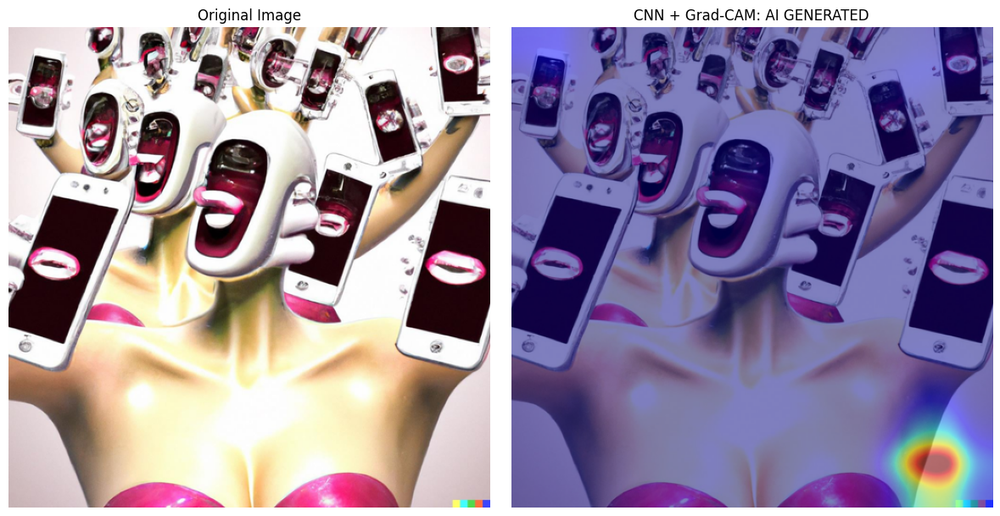

In [49]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_five,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_five,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img5.png"
)

📊 Prediction: AI GENERATED (class 0)


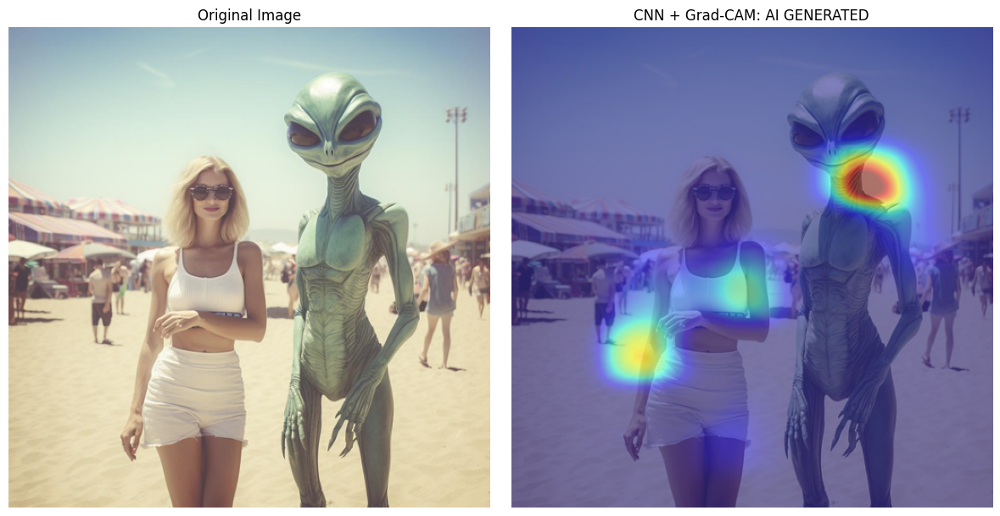

In [50]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_six,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_six,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img6.png"
)

📊 Prediction: AI GENERATED (class 0)


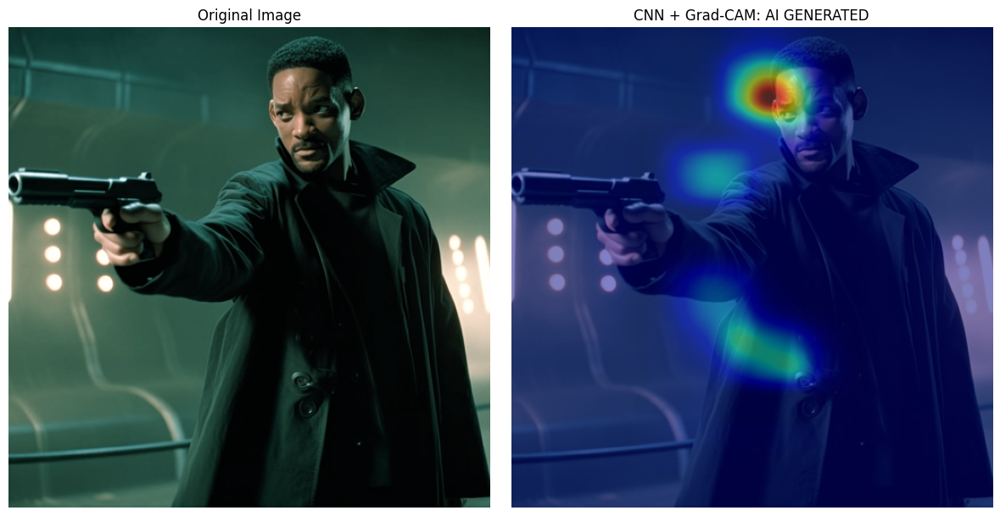

In [51]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_seven,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_seven,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img7.png"
)

📊 Prediction: AI GENERATED (class 0)


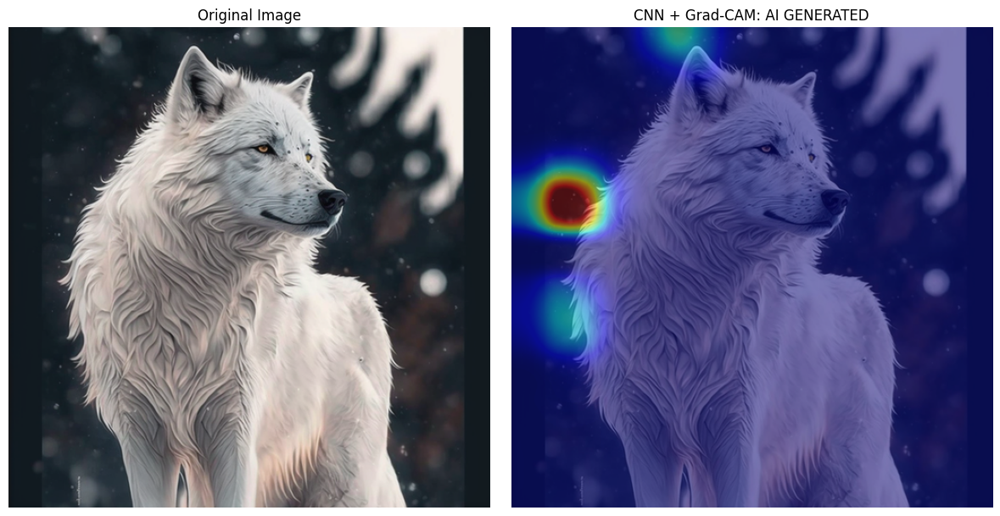

In [52]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_eight,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_eight,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img8.png"
)

📊 Prediction: AI GENERATED (class 0)


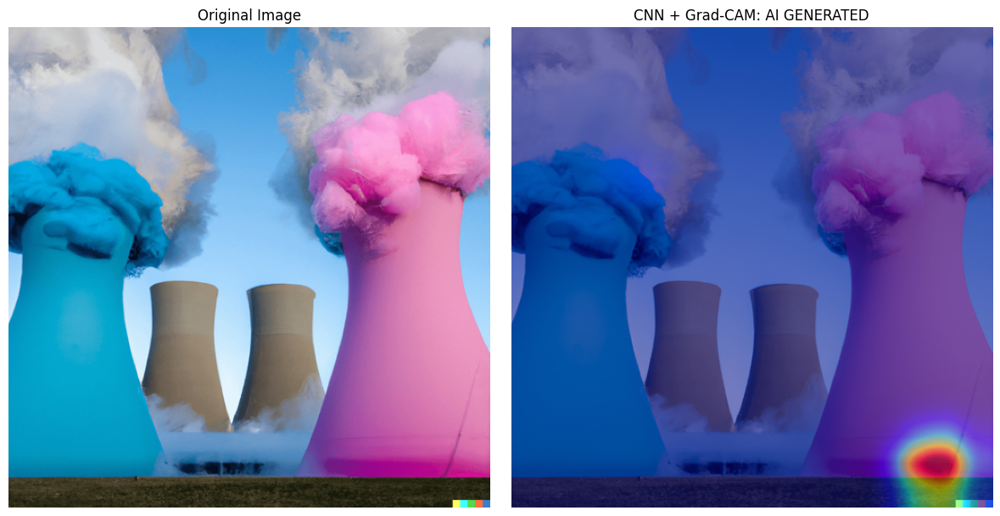

In [53]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_nine,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_nine,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img9.png"
)

📊 Prediction: REAL (class 1)


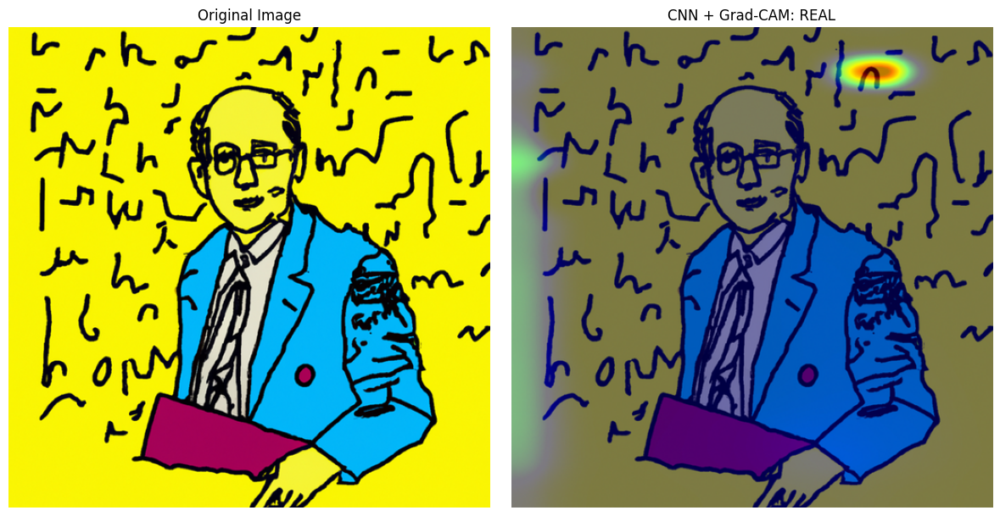

In [54]:
_, gradcam_img, predicted_label = generate_gradcam(
    image_path=img_path_ai_ten,
    model=cnn_model,
    transform=cnn_transform,
    class_names=class_names
)

show_side_by_side_from_paths(
    original_path=img_path_ai_ten,
    gradcam_image=gradcam_img,
    title=f"CNN + Grad-CAM: {predicted_label.upper()}",
    filename=f"ai_generated/img10.png"
)